In [6]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

In [35]:
## Loading libraries
from sklearn.preprocessing import MinMaxScaler
from sklearn.cluster import KMeans

from matplotlib import pyplot as plt
import seaborn as sns

import pandas as pd
import numpy as np


## Setting columns and rows display
pd.set_option('display.max_colwidth', None)

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
pd.set_option('mode.chained_assignment', None)

### **Loading Data**

In [10]:
## Reading File
df = pd.read_excel('Sample_Longlist_Data.xlsx', sheet_name='Sheet1')

### **Data column details**

In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1839 entries, 0 to 1838
Data columns (total 18 columns):
 #   Column                                             Non-Null Count  Dtype         
---  ------                                             --------------  -----         
 0   Date Added                                         1839 non-null   datetime64[ns]
 1   category                                           1839 non-null   object        
 2   sellerlink                                         1839 non-null   object        
 3   sellerlink-url                                     1839 non-null   object        
 4   sellerstorefront-url                               1839 non-null   object        
 5   sellerproductcount                                 1513 non-null   object        
 6   sellerratings                                      1411 non-null   object        
 7   sellerdetails                                      1812 non-null   object        
 8   seller business na

In [12]:
df.describe()

,Count of seller brands,Max % of negative seller ratings - last 30 days,Max % of negative seller ratings - last 90 days,Max % of negative seller ratings - last 12 months,Hero Product 1 #ratings,Hero Product 2 #ratings
count,1839.000000,1839.000000,1839.000000,1839.000000,1839.000000,1839.000000
mean,6.951060,5.808592,7.632409,12.312670,1399.745514,765.173464
std,6.232073,18.117027,19.902394,23.435871,6204.123987,3817.355945
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,5.000000,0.000000,0.000000,0.000000,3.000000,1.000000
75%,15.000000,0.000000,4.000000,14.000000,176.500000,87.500000
max,16.000000,100.000000,100.000000,100.000000,86856.000000,70732.000000


### **Data Cleaning and Data Filtering**

In [37]:
## Extract Country code from 'businessaddress' column
df['country_code'] = df['businessaddress'].str[-2:]

## Filtering records (Removing sellers from China)
df = df[df['country_code'] != 'CN']

#~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
## Extract product count using 'sellerproductcount' column
df['seller_count'] = df['sellerproductcount'].str.split(' ').str[-2]
df['seller_count'] = df['seller_count'].str.replace(',','').astype(float)


#~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
## Parsing 'sellerratings' column

# Extracting the positive rating percentage
df['seller_positive_rating_percentage'] = df['sellerratings'].str.split(' ').str[0]
df['seller_positive_rating_percentage'] = df['seller_positive_rating_percentage'].str.replace('%','').astype(float)

# Extracting the count of positive ratings
df['seller_positive_rating_count'] = df['sellerratings'].str.split('(').str[1].str.split(' ').str[0].astype(float)


#~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
## Extract contact details from 'sellerdetails' column

# 1. Extracting all the email id's
df['seller_email_address']=df['sellerdetails'].str.findall('(\S+@\S+)')

# Replacing Null Values with empty list
df['seller_email_address'] = df['seller_email_address'].apply(lambda d: d if isinstance(d, list) else [])

# Breakdown email_address list into multiple emails
df[['seller_email_address1','seller_email_address2']] = pd.DataFrame(df['seller_email_address'].values.tolist())

# Standardizing the email columns values ()
email_columns_list = ['seller_email_address1','seller_email_address2']
for column in email_columns_list:
    
    df[column] = df[column].str.replace('Address:','')
    df[column] = df[column].str.replace('E-Mail:','')
    df[column] = df[column].str.replace('Contact;','')

    df[column] = np.where(df[column].str.contains('.de') == True, df[column].str.split('.de',1).str[0]+'.de', df[column])
    df[column] = np.where(df[column].str.contains('.com') == True, df[column].str.split('.com',1).str[0]+'.com', df[column])
    df[column] = np.where(df[column].str.contains('.uk') == True, df[column].str.split('.uk',1).str[0]+'.uk', df[column])
    df[column] = np.where(df[column].str.contains('.net') == True, df[column].str.split('.net',1).str[0]+'.net', df[column])
    df[column] = np.where(df[column].str.contains("\)") == True, df[column].str.split(')',1).str[1], df[column])


# 2. Extracting Phone Number
df['seller_phone_number']=df['sellerdetails'].str.findall('([\bTel\b\bTelefon\b\bPhone\b\bTelefonnummer\b]*[\.\:\s]*[+]?\d+[-\.\s\(\)\|\/\–]*\d+[-\.\s\(\)\|\/\–]*\d+[-\.\s\(\)\|\/\–]*\d+[-\.\s\(\)\|\/\–]*\d+)').astype(str)
df['seller_phone_number'] = df['seller_phone_number'].apply(lambda element: element.replace('\'', '\"').replace('\\','-').replace('-xa0',''))


#~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
## Calculating thenumbers of days when seller was added
df['days_when_seller_added'] = pd.Timestamp.now().normalize() -  df['Date Added']
df['days_when_seller_added'] = df['days_when_seller_added'].astype('timedelta64[D]').astype(str)
df['days_when_seller_added'] = df['days_when_seller_added'].str.replace(' days','').astype(float).astype(int)


**Note** :: For seller to contact through phone, needs to get the number from the **seller_phone_number** column (which basically contains the list of numbers) where we have any of the preceding string **['Tel', 'Telefon', 'Telefonnummer', 'euernummer', 'Phone']** before the number

### **Data Analysis**

### **1. Null Value check**

In [38]:
## Function for checking percentage of null values in dataframe columns
def null_value_check_in_dataframe(df):
    percent_missing = df.isnull().sum() * 100 / len(df)
    missing_value_df = pd.DataFrame({'column_name': df.columns,
                                     'percent_missing': percent_missing})
    return missing_value_df

In [15]:
df_null = null_value_check_in_dataframe(df)
df_null

,column_name,percent_missing
Date Added,Date Added,0.000000
category,category,0.000000
sellerlink,sellerlink,0.000000
sellerlink-url,sellerlink-url,0.000000
sellerstorefront-url,sellerstorefront-url,0.000000
sellerproductcount,sellerproductcount,20.099668
sellerratings,sellerratings,7.142857
sellerdetails,sellerdetails,4.318937
seller business name,seller business name,9.302326
businessaddress,businessaddress,12.458472


### 2. **Complete Data Profiling**




**Note** :: Need to intall the below packages in order **pandas-profiling** to work. For the dependent libraries I have mentioned the version as per my jupyter, it can vary or not required at all. Perform Below actions--

*   Install libraries

*   Restart the kernel (if it doesn't work)

I'm also attaching the **Marketplace_data_analysis.html** file for data profiling along with the submission, so have a look if the above steps don't work



In [ ]:
## Install pandas-profiling
import sys
!pip install scipy==1.5.2
!pip install pandas==1.0.4
!{sys.executable} -m pip install -U pandas-profiling[notebook]
!jupyter nbextension enable --py widgetsnbextension

In [40]:
from pandas_profiling import ProfileReport

profile = ProfileReport(df, title="Marketplace data analysis")
profile

# OR you can run the below command also
#profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/41 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [41]:
## Saving the output file in html format
profile.to_file(output_file='/content/gdrive/My Drive/Marketplace_data_analysis.html')

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

### **Renaming columns**

In [42]:
## Renaming column names
df = df.rename(columns={'Count of seller brands': 'count_of_seller_brands', 
                        'Max % of negative seller ratings - last 30 days': 'max_percentage_of_negative_seller_ratings_in_last_30_days',
                        'Max % of negative seller ratings - last 90 days':'max_percentage_of_negative_seller_ratings_in_last_90_days',
                        'Max % of negative seller ratings - last 12 months':'max_percentage_of_negative_seller_ratings_in_last_12_months',
                        'Hero Product 1 #ratings':'hero_product1_ratings',
                        'Hero Product 2 #ratings':'hero_product2_ratings'})

### **Subsetting dataframe (Retain columns which will be helpful in analysis)**



In [43]:
selected_columns = ['count_of_seller_brands','max_percentage_of_negative_seller_ratings_in_last_30_days','max_percentage_of_negative_seller_ratings_in_last_90_days',
'max_percentage_of_negative_seller_ratings_in_last_12_months','hero_product1_ratings','hero_product2_ratings','seller_count','seller_positive_rating_percentage',
'seller_positive_rating_count']

df_final = df[selected_columns]

### **Missing Values imputation**

In [44]:
## Missing value imputation with mean
def missing_value_imputation(df):
    df.fillna(df.mean(), inplace=True)
    return df

df_final = missing_value_imputation(df_final)

In [45]:
## Converting columns to integer type
df_final['seller_count'] = df_final['seller_count'].astype(int)
df_final['seller_positive_rating_percentage'] = df_final['seller_positive_rating_percentage'].astype(int)
df_final['seller_positive_rating_count'] = df_final['seller_positive_rating_count'].astype(int)

### **Data Standardization**

In [46]:
#Normalization - MinMaxScaler Transform
trans = MinMaxScaler()
scaled_features = trans.fit_transform(df_final)

# convert the array back to a dataframe
df_final = pd.DataFrame(scaled_features, index=df_final.index, columns=df_final.columns)

### **K-Means for clustering the sellers**

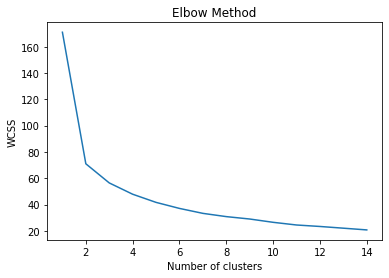

In [47]:
## Finding the appropriate number of cluters - Using Elbow method

# wcss - Within Cluster Sum of Squares (WCSS)
wcss = []

for i in range(1, 15):
    kmeans = KMeans(n_clusters=i, init='k-means++', max_iter=300, n_init=10, random_state=0)
    kmeans.fit(df_final)
    wcss.append(kmeans.inertia_)
    
plt.plot(range(1, 15), wcss)
plt.title('Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()

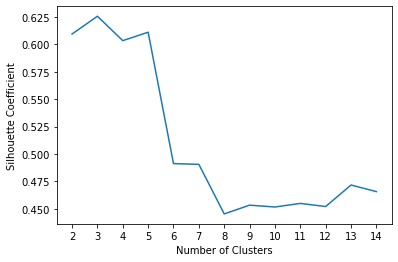

In [48]:
from sklearn.metrics import silhouette_score
## Finding the appropriate number of cluters - Using silhouette coefficient

# A list holds the silhouette coefficients for each k
silhouette_coefficients = []

# Notice you start at 2 clusters for silhouette coefficient
for k in range(2, 15):
    kmeans = KMeans(n_clusters=k, init='k-means++', max_iter=300, n_init=10, random_state=0)
    kmeans.fit(df_final)
    score = silhouette_score(scaled_features, kmeans.labels_)
    silhouette_coefficients.append(score)
    
plt.plot(range(2, 15), silhouette_coefficients)
plt.xticks(range(2, 15))
plt.xlabel("Number of Clusters")
plt.ylabel("Silhouette Coefficient")
plt.show()

In [49]:
# As per the Elbow method optial cluster is between 4 and 6, so considering 5
# Also, as per the silhouette coefficient peak is at 5
# So taking the clusters as 5 for K-Means

kmeans = KMeans(n_clusters=5, init='k-means++', max_iter=300, n_init=10, random_state=0)
predict = kmeans.fit_predict(df_final)

In [50]:
df['cluster_id'] = pd.Series(predict, index=df.index)

### **Seller Contact details Dataframe**

In [51]:
df_seller_contacts = df[['sellerlink', 'country_code','seller_email_address1','seller_email_address2','seller_phone_number','cluster_id']]
df_seller_contacts.head(5)

,sellerlink,country_code,seller_email_address1,seller_email_address2,seller_phone_number,cluster_id
0,Seller 1,US,jadgemaello@gmail.com,None,"["" 10022-6630"", "" +1208-964-6807"", "" 10022-6630"", "" +1208-964-6807"", "":30-0961431""]",1
1,Seller 2,DE,info@1a-ha.de,info@1a-ha.de,"[""er 039932-829721"", ""llee 2-n17213"", ""Tel.: 039932 - 829721"", "".: 039932 – 81417"", "" 223758473""]",0
5,Seller 6,NaN,None,None,[],1
14,Seller 15,DE,None,None,"[""e 26-n 33829"", ""Telefon: 015140008562"", ""215752000"", ""01.08.2015""]",1
19,Seller 20,DE,info@itenga.de,None,"["" 10-n 32469"", ""Tel.: 0570591155"", "": 0570591156"", "" 10862"", "" 213823102""]",0


### **Cluster Analysis**

In [52]:
clusters_count_of_seller_brands = pd.DataFrame(df.groupby(["cluster_id"]).count_of_seller_brands.mean())
clusters_max_percentage_of_negative_seller_ratings_in_last_30_days = pd.DataFrame(df.groupby(["cluster_id"]).max_percentage_of_negative_seller_ratings_in_last_30_days.mean())
clusters_max_percentage_of_negative_seller_ratings_in_last_90_days = pd.DataFrame(df.groupby(["cluster_id"]).max_percentage_of_negative_seller_ratings_in_last_90_days.mean())
clusters_max_percentage_of_negative_seller_ratings_in_last_12_months = pd.DataFrame(df.groupby(["cluster_id"]).max_percentage_of_negative_seller_ratings_in_last_12_months.mean())
clusters_hero_product1_ratings = pd.DataFrame(df.groupby(["cluster_id"]).hero_product1_ratings.mean())
clusters_hero_product2_ratings = pd.DataFrame(df.groupby(["cluster_id"]).hero_product2_ratings.mean())
clusters_seller_count = pd.DataFrame(df.groupby(["cluster_id"]).seller_count.mean())
clusters_seller_positive_rating_percentage = pd.DataFrame(df.groupby(["cluster_id"]).seller_positive_rating_percentage.mean())
clusters_seller_positive_rating_count = pd.DataFrame(df.groupby(["cluster_id"]).seller_positive_rating_count.mean())

In [53]:
df_analysis = pd.concat([pd.Series([0,1,2,3,4,5]), clusters_count_of_seller_brands, clusters_max_percentage_of_negative_seller_ratings_in_last_30_days,
                        clusters_max_percentage_of_negative_seller_ratings_in_last_90_days,clusters_max_percentage_of_negative_seller_ratings_in_last_12_months,
                        clusters_hero_product1_ratings,clusters_hero_product2_ratings,clusters_seller_count,clusters_seller_positive_rating_percentage,
                        clusters_seller_positive_rating_count], axis=1)
df_analysis.columns = ["ClusterID", "Mean_count_of_seller_brands", "Mean_max_percentage_of_negative_seller_ratings_in_last_30_days",
                      "Mean_max_percentage_of_negative_seller_ratings_in_last_90_days","Mean_max_percentage_of_negative_seller_ratings_in_last_12_months",
                      "Mean_hero_product1_ratings","Mean_hero_product2_ratings","Mean_seller_count","Mean_seller_positive_rating_percentage",
                      "Mean_seller_positive_rating_count"]
df_analysis.head()

,ClusterID,Mean_count_of_seller_brands,Mean_max_percentage_of_negative_seller_ratings_in_last_30_days,Mean_max_percentage_of_negative_seller_ratings_in_last_90_days,Mean_max_percentage_of_negative_seller_ratings_in_last_12_months,Mean_hero_product1_ratings,Mean_hero_product2_ratings,Mean_seller_count,Mean_seller_positive_rating_percentage,Mean_seller_positive_rating_count
0,0,1.526316,2.741228,3.539474,4.754386,216.179825,91.938596,3894.609091,92.406250,642.968750
1,1,14.723404,3.924012,4.568389,5.683891,3971.237082,2212.164134,4818.261398,91.984472,298.763975
2,2,12.083333,84.750000,56.166667,40.333333,2170.833333,1795.333333,13339.909091,66.000000,26.000000
3,3,15.478261,9.304348,8.826087,8.869565,47481.739130,25952.695652,38017.130435,90.173913,1674.869565
4,4,3.400000,5.000000,26.600000,75.500000,58.300000,9.900000,13760.375000,23.200000,6.000000


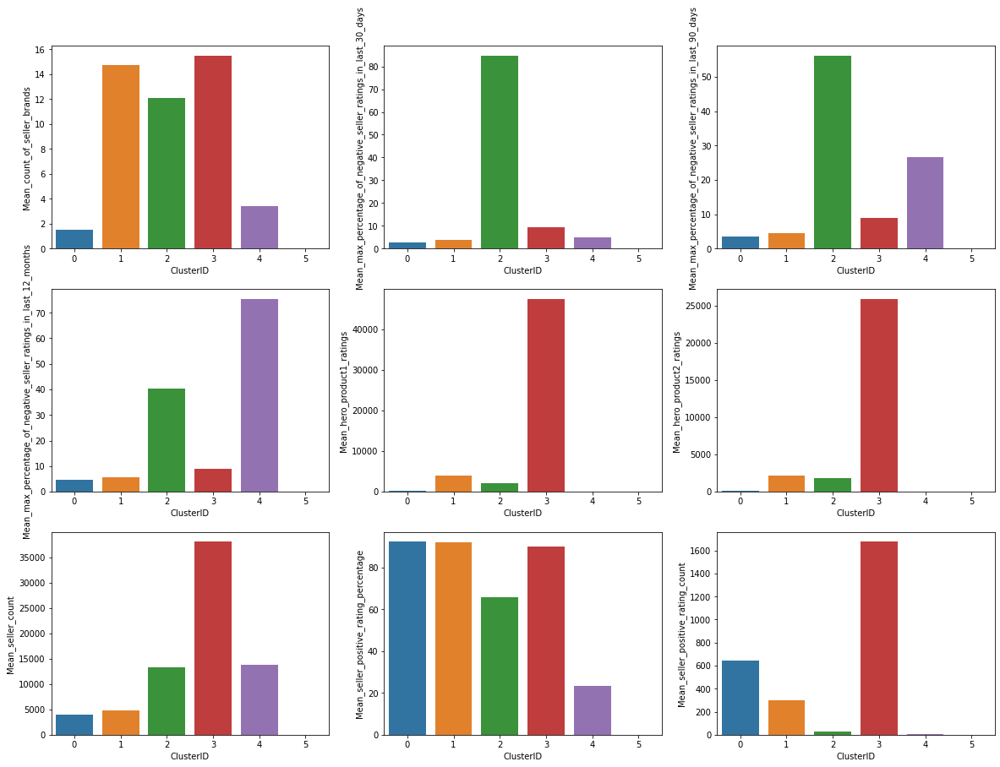

In [54]:
fig, axs = plt.subplots(3,3)
fig.set_figheight(15)
fig.set_figwidth(20)

sns.barplot(x=df_analysis.ClusterID, y=df_analysis.Mean_count_of_seller_brands,ax=axs[0][0])
sns.barplot(x=df_analysis.ClusterID, y=df_analysis.Mean_max_percentage_of_negative_seller_ratings_in_last_30_days,ax=axs[0][1])
sns.barplot(x=df_analysis.ClusterID, y=df_analysis.Mean_max_percentage_of_negative_seller_ratings_in_last_90_days,ax=axs[0][2])
sns.barplot(x=df_analysis.ClusterID, y=df_analysis.Mean_max_percentage_of_negative_seller_ratings_in_last_12_months,ax=axs[1][0])
sns.barplot(x=df_analysis.ClusterID, y=df_analysis.Mean_hero_product1_ratings,ax=axs[1][1])
sns.barplot(x=df_analysis.ClusterID, y=df_analysis.Mean_hero_product2_ratings,ax=axs[1][2])
sns.barplot(x=df_analysis.ClusterID, y=df_analysis.Mean_seller_count,ax=axs[2][0])
sns.barplot(x=df_analysis.ClusterID, y=df_analysis.Mean_seller_positive_rating_percentage,ax=axs[2][1])
sns.barplot(x=df_analysis.ClusterID, y=df_analysis.Mean_seller_positive_rating_count,ax=axs[2][2])

### **Clustering Result**

In [30]:
## As per the analysis ClusterID - 3 sellers are the best one, so definitely we'll contact and acquire those
## Next best clusterID's are 0 and 1 respectively

In [56]:
## Best Sellers

df_best_sellers = df_seller_contacts[df_seller_contacts['cluster_id'] == 3]
df_best_sellers.head(5)

,sellerlink,country_code,seller_email_address1,seller_email_address2,seller_phone_number,cluster_id
23,Seller 24,DE,info@kaleidoshop.de,None,"["" 99-107 59269"", "" 214 670 936"", ""Telefon: 02521/8406-0""]",3
26,Seller 27,US,info@kamdi24.de,None,[],3
36,Seller 37,DE,koeln@party-discount.de,None,"["" 2-n 66557"", ""Tel: 06825 / 89697-0"", "": 06825 / 89697-20"", "" 17443"", ""815026868"", "" 56344043""]",3
37,Seller 38,DE,info@karneval-fasching-shop.de,None,"["" 3-n 48529"", ""Telefon: +49 5921 834011"", "": +49 5921 834044"", "" 130013"", ""117046865""]",3
53,Seller 54,DE,gesthuesen@t-online.de,None,"[""-n33142"", ""Telefon: 02951/9849790"", "": 02951/9849797"", ""231187067""]",3
